# Galbraith Lab: Single Particle Tracking (SPT) 

### Research Question: Is there a mechanism that recycles actin other than diffusion? 

### Project Goal: Identify or build an effective single particle tracking algorithm; create a “map of trajectories” representing actin molecules in live cell imaging by Total Internal Reflection Fluorescence (TIRF). 

#### This script is meant to explore SPT using thunderSTORM for actin monomer localization in TIRF imaging and SPT using Trackpy.

[Trackpy](https://soft-matter.github.io/trackpy/v0.3.2/installation.html) installation page    
Optional Dependancies:    
    - PyTables  
    - numba  
    - PIL   

In [1]:
import trackpy as tp
import numpy as np 
from matplotlib import pyplot as plt 
import seaborn as sbn 
import sys 
import os
import evans_SPT_lib as spt # saved in box 
import time
import pims
import pandas as pd
from matplotlib import animation
import statsmodels.formula.api as sm

## Read TIF into memory 

In [2]:
# list the available data stored in ./data/
names = os.listdir('./data/')
img_paths = ['./data/' + name for name in names]
names

['180920_Cs1C1_CAD_JFHaloLifeactRac_10ms_2Kfr.tif',
 '180920_Cs1C2_CAD_JFHaloLifeactRac_14ms_2Kfr_02-CROPPED.tif',
 '180920_Cs1C2_CAD_JFHaloLifeactRac_14ms_2Kfr_02.tif',
 '180920_Cs1C3_CAD_JFHaloLifeactRac_10ms_2Kfr.tif',
 '180920_Cs1C4_CAD_JFHaloG13RRac_08ms_2Kfr_07.tif',
 '180920_Cs1C4_CAD_JFHaloG13RRac_08ms_2Kfr_08.tif',
 '180920_Cs1C8_CAD_JFHaloG13RRac_10ms_2Kfr_14.tif',
 '180920_Cs1C8_CAD_JFHaloG13RRac_29ms_2Kfr_13.tif']

In [3]:
# read all data into memory so we can view examples to choose from
data = [spt.tif_img(path) for path in img_paths] 
data.pop(1) # -cropped file is not a tif stack, causes issues- just use it for the trackpy Image Sequence 

In [4]:
# this takes a long time for some reason - figsize maybe? 
# this displays one frame from each of the available tif stacks in ./data/ (in order names are listed above)
fig, axes = plt.subplots(1,7, figsize=(128*7,128), sharey=True)
for ax,vid,name in zip(axes.flatten(), data, names): 
    ax.imshow(vid.img[0])
    ax.set_title(name)
plt.show()


#### From the plots above, second img from left looks like the lowest particle density, so let's start with that

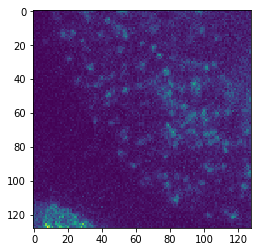

In [5]:
# choose 
data = data[1] # to conserve memory 
plt.imshow(data.img[0]) # double check we got the right one
plt.show()

#### Crop - remove lower left high particle density 

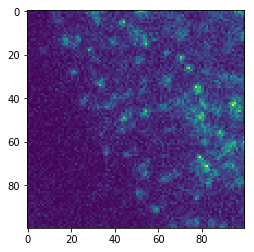

In [6]:
# 100 x 100 - or crop in FIJI and choose above 
data.crop( (28,0), (128,100) )
data.img.shape
plt.imshow(data.img[0])
plt.show()

#### Let's vizualize in 3D 

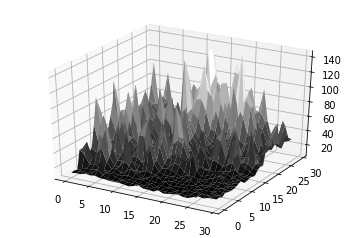

In [7]:
# if you run this function outside of jupyter notebook, you get an interactive 3d plot. change downscale parameter for smoothing
data.plot3D(downscale=0.3)

#### Estimate noise and plot distribution

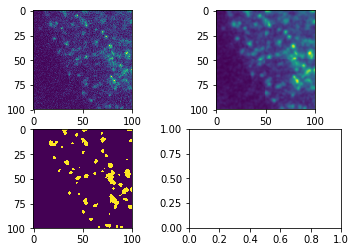

50.0% complete, frames processed: 1, time elapsed: 0.64s


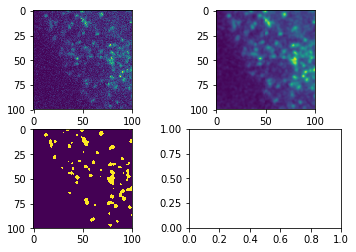

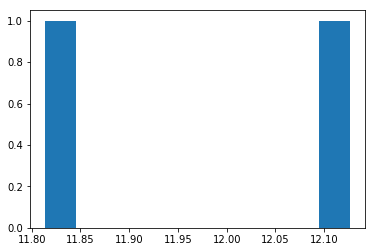

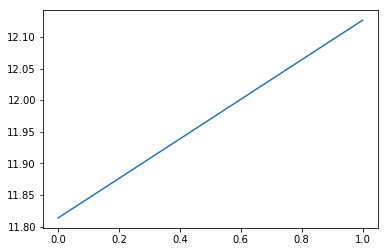

1.6045372486114502

In [8]:
# viz the SNR masks - diagnostic 
tic = time.time()
data.gen_SNR_hist(n=2, show_imgs=True)
time.time() - tic

10.0% complete, frames processed: 200, time elapsed: 98.45s
20.0% complete, frames processed: 400, time elapsed: 204.56s
30.0% complete, frames processed: 600, time elapsed: 285.14s
40.0% complete, frames processed: 800, time elapsed: 366.50s
50.0% complete, frames processed: 1000, time elapsed: 450.51s
60.0% complete, frames processed: 1200, time elapsed: 529.17s
70.0% complete, frames processed: 1400, time elapsed: 604.48s
80.0% complete, frames processed: 1600, time elapsed: 677.06s
90.0% complete, frames processed: 1800, time elapsed: 744.15s


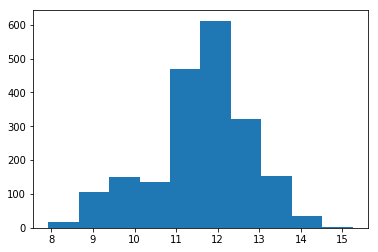

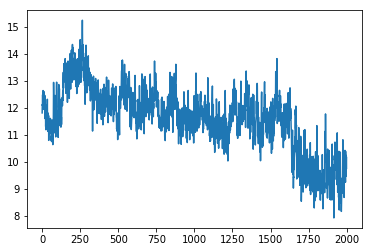

804.7190539836884

In [9]:
# calculate the SNR histogram, literature shows that a SNR < 4 has very poor performance, but > 4 is generally functional (and has little improvement with additional increase of SNR)
tic = time.time()
data.gen_SNR_hist(n=2000, show_imgs=False) # change to n=2000 for tomorrow 
time.time() - tic

# Trackpy 

ImageSequence object can be accessed through data.imgSeq   

Following [this](https://soft-matter.github.io/trackpy/v0.3.2/tutorial/walkthrough.html) tutorial. There are a myriad of great resources on that site, worth looking into. 


In [10]:
# couldn't figure out how to crop, so I'm using this for now - build it into my class later 
frames = pims.TiffStack('./data/180920_Cs1C2_CAD_JFHaloLifeactRac_14ms_2Kfr_02-CROPPED.tif')
frames

<Frames>
Source: ./data/180920_Cs1C2_CAD_JFHaloLifeactRac_14ms_2Kfr_02-CROPPED.tif
Length: 2000 frames
Frame Shape: 102 x 127
Pixel Datatype: <class 'numpy.uint16'>

Frame([[118, 150,  97, ..., 171, 366, 195],
       [126, 146, 172, ..., 201, 275, 321],
       [133, 113, 132, ..., 222, 308, 477],
       ...,
       [164, 161, 199, ..., 208, 196, 492],
       [203, 223, 150, ..., 237, 366, 192],
       [166, 103, 152, ..., 447, 347, 318]], dtype=uint16)
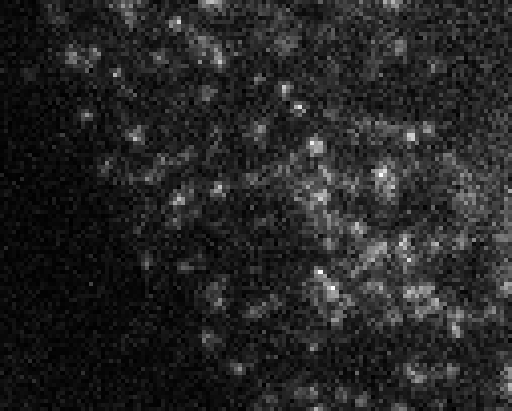

In [11]:
frames[0]

### Test out their localization alg. 
[trackpy.locate](http://soft-matter.github.io/trackpy/dev/generated/trackpy.locate.html) documentation

In [12]:
f = tp.locate(frames[0], 5, preprocess=True)
f.head()

,y,x,mass,size,ecc,signal,raw_mass,ep,frame
1,2.293238,106.823427,91.438494,1.080269,0.712433,22.142612,3841.0,0.569389,0
2,3.273664,69.226197,261.473843,1.234483,0.031051,47.952342,4657.0,0.280086,0
3,4.345450,14.582678,224.342594,1.237986,0.527956,41.831510,3585.0,0.842353,0
4,4.215392,31.731269,445.343617,1.244091,0.093936,77.143999,6091.0,0.147967,0
5,4.062277,90.603375,112.238559,0.991587,0.577118,33.138584,4105.0,0.426772,0


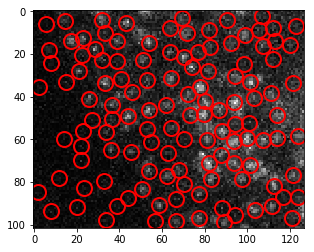

In [13]:
plt.figure()
tp.annotate(f, frames[0])

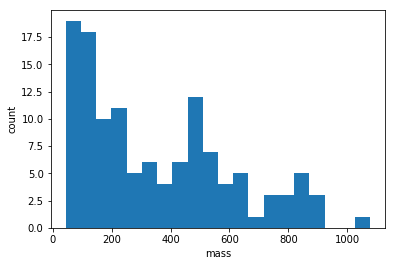

In [14]:
fig, ax = plt.subplots()
ax.hist(f['mass'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='mass', ylabel='count');
plt.show()

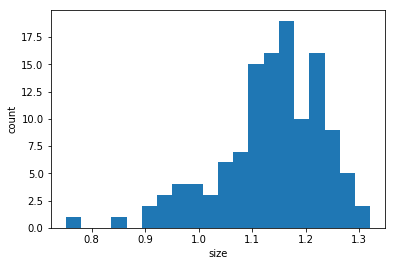

In [15]:
fig, ax = plt.subplots()
ax.hist(f['size'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='size', ylabel='count');
plt.show()

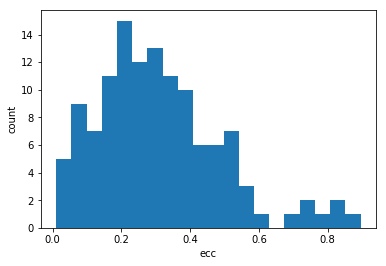

In [16]:
fig, ax = plt.subplots()
ax.hist(f['ecc'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='ecc', ylabel='count');
plt.show()

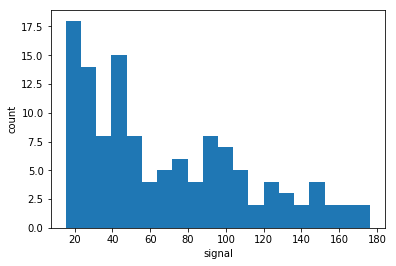

In [17]:
fig, ax = plt.subplots()
ax.hist(f['signal'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='signal', ylabel='count');
plt.show()

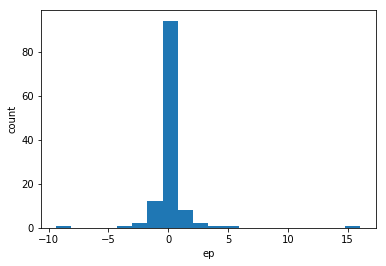

In [18]:
fig, ax = plt.subplots()
ax.hist(f['ep'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='ep', ylabel='count');
plt.show()

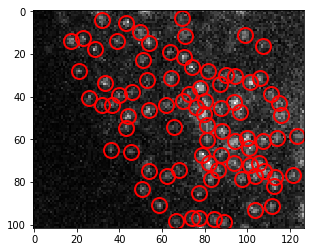

In [19]:
# choose refined parameters based on distributions above (looking for bimodaal dists or eliminate tails/skew)

f = tp.locate(frames[0], 5, invert=False, minmass=200, maxsize=None, separation=3, preprocess=True, noise_size=1.1)
plt.figure()
tp.annotate(f, frames[0]);


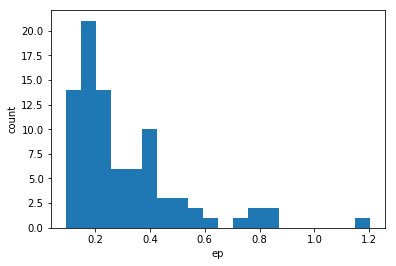

In [20]:
fig, ax = plt.subplots()
ax.hist(f['ep'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='ep', ylabel='count');
plt.show()

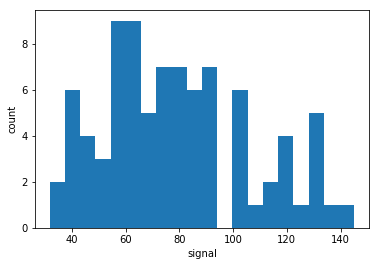

In [21]:
fig, ax = plt.subplots()
ax.hist(f['signal'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='signal', ylabel='count');
plt.show()

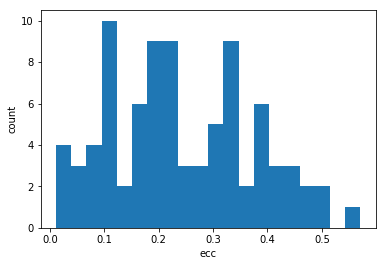

In [22]:
fig, ax = plt.subplots()
ax.hist(f['ecc'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='ecc', ylabel='count');
plt.show()

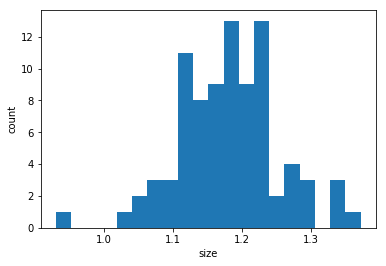

In [23]:
fig, ax = plt.subplots()
ax.hist(f['size'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='size', ylabel='count');
plt.show()

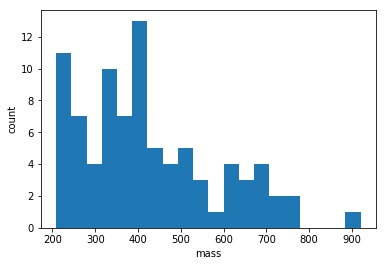

In [24]:
fig, ax = plt.subplots()
ax.hist(f['mass'], bins=20)

# Optionally, label the axes.
ax.set(xlabel='mass', ylabel='count');
plt.show()

### Let's run all frames with these settings - then link

In [25]:
f = tp.batch(frames, 5, invert=False, minmass=200, maxsize=None, separation=3, preprocess=True, noise_size=1.1)

Frame 1999: 19 features


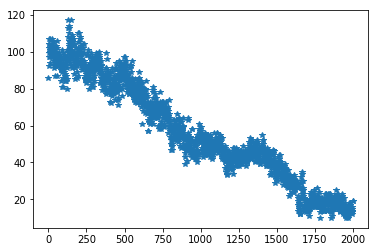

In [26]:
frame_feature_count = f["frame"].value_counts()
plt.figure()
plt.plot(frame_feature_count, '*')
plt.show()

This is really interesting! As time progresses, our features decrease (as we would expect; in-plane actin photobleaching) and it's near linear (interesting bump). Should be able to calculate average life span from slope. 
 

slope estimate over all = -85/2000 particles/frame -> 2000/85 frames/particle ~ 23.5 frames/particle --(14ms shutter)--> 23.5*14 ~ 329ms 

particle lifespan estimate ~ 330 ms

This isn't entirely accurate, remember that TIRF imaging increases intensity to activate new flurophores. This is most likely responsible for the 'bumps' we see (at t=500,100,1250, 1700). However, the local slope between these points should still estimate photobleaching rate. 

Estimate between 500 and 900: 80 (t=550) -> 50 (t=900) -> -30 particles / 350 frames => 350 / 30 f/p ~ 12 frames per particle ... significantly faster photobleaching rate than I expected.  

## Link Frames 

[trackpy.link](http://soft-matter.github.io/trackpy/v0.3.0/generated/trackpy.link.html) documentation

In [27]:
# for this data, anything more than 5 throws an error. May be more advanced ways to increase 
search_range = 5 # this is a big hyper-parameter, too small and you'll get inaccruate linking, too large and it becomes computationally intractable 
t = tp.link_df(f, search_range, memory=3)

Frame 1999: 19 trajectories present.


In [28]:
t.head()

,y,x,mass,size,ecc,signal,raw_mass,ep,frame,particle
0,3.287691,69.229006,208.729452,1.237860,0.038959,39.160982,4657.0,0.501808,0,0
62,70.878842,93.755155,405.216116,1.174438,0.344958,70.222822,6892.0,0.176541,0,1
61,71.262596,81.828430,735.981654,1.230941,0.016997,116.821114,9425.0,0.101775,0,2
60,64.792746,35.899609,419.716658,1.163652,0.011488,80.652764,4206.0,0.798785,0,3
59,67.162784,87.456921,262.897864,1.102096,0.399206,61.495049,5850.0,0.252996,0,4


In [29]:
# filter short duration tracks 
t1 = tp.filter_stubs(t, 13) # value is # frames needed to survive - we estimated 23 frame lifespan above
# should filter tracks with frames > 33 too # what distribution patterns does photobleaching follow?
# can also try to filter tracks that DONT move at all. 
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t1['particle'].nunique())

Before: 14586
After: 2449


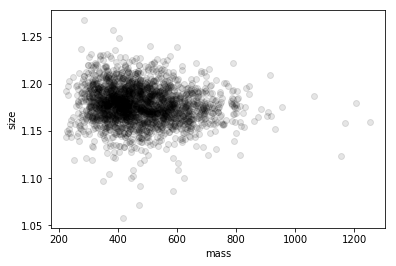

In [30]:
# We can also filter trajectories by their appearance. At this stage, with trajectories linked, we can look at a feature's "average appearance" throughout its trajectory, giving a more accurate picture.
plt.figure()
tp.mass_size(t1.groupby('particle').mean()); # convenience function -- just plots size vs. mass

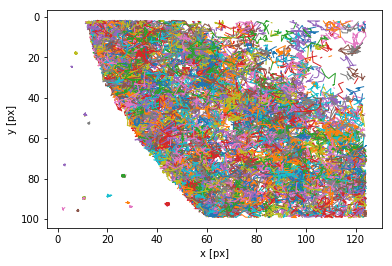

In [31]:
plt.figure()
tp.plot_traj(t1);

C:\anaconda-3.5.2.0\lib\site-packages\trackpy\utils.py:313: FutureWarning: 'frame' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version
  return df.sort_values(*args, by=by, **kwargs)
C:\anaconda-3.5.2.0\lib\site-packages\trackpy\motion.py:289: FutureWarning: 'frame' is both an index level and a column label.
Defaulting to column, but this will raise an ambiguity error in a future version
  dx = f_diff.loc[mask, pos_columns + ['frame']].groupby('frame').mean()


<Figure size 432x288 with 0 Axes>

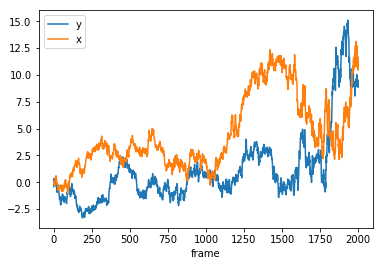

In [32]:
d = tp.compute_drift(t1)

plt.figure()
d.plot();
plt.show()

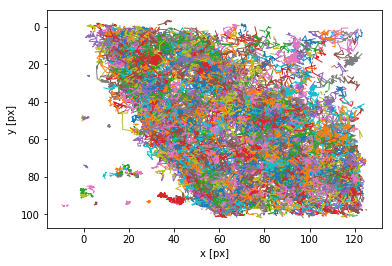

In [33]:
# subtract drift and observe random walk
tm = tp.subtract_drift(t1.copy(), d)
plt.figure()
ax = tp.plot_traj(tm)

## Analyze Trajectories 

In [34]:
#Compute the mean squared displacement of each particle and plot MSD vs. lag time.
# they used tm (drift subtracted) but we want our evective movement, right? 
#im = tp.imsd(t1, 100/285., 24)  # microns per pixel = 100/285., frames per second = 24 <- their example 
i1 = tp.imsd(t1, 11/1000., 71) # 14 ms / frame = 14e-3 s/frame -> 71.4 frames/second
im = tp.imsd(tm, 11/1000., 71)

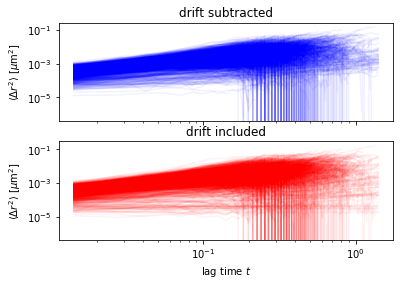

In [35]:
fig, ax = plt.subplots(2,1, sharex=True)
ax[0].plot(im.index, im, 'b-', alpha=0.05)  # black lines, semitransparent
ax[1].plot(i1.index, i1, 'r-', alpha=0.05)
ax[0].set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]', xlabel=' ')
ax[0].set_xscale('log')
ax[0].set_yscale('log')
ax[0].set_title('drift subtracted')
ax[1].set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]', xlabel='lag time $t$')
ax[1].set_xscale('log')
ax[1].set_yscale('log')
ax[1].set_title('drift included')
plt.show()

In [36]:
em = tp.emsd(tm, 100/285., 24)

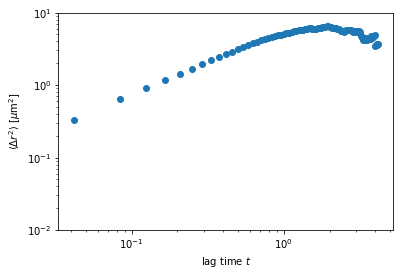

In [37]:
# this is SUPPOSED to be linear - need to read about what this is trying to show 

fig, ax = plt.subplots()
ax.plot(em.index, em, 'o')
ax.set_xscale('log')
ax.set_yscale('log')
ax.set(ylabel=r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]',
       xlabel='lag time $t$')
ax.set(ylim=(1e-2, 10));
plt.show()

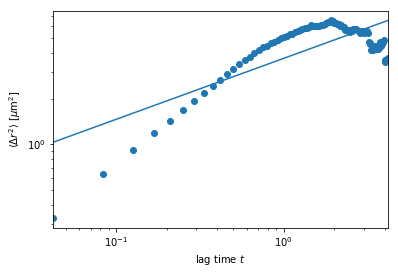

In [38]:
# this fit is very obviously wrong, we can run a regression on the left-most dataset but the real question is, what is happening in the high lag time observations? 
plt.figure()
plt.ylabel(r'$\langle \Delta r^2 \rangle$ [$\mu$m$^2$]')
plt.xlabel('lag time $t$');
a = tp.utils.fit_powerlaw(em)  # performs linear best fit in log space, plots
plt.show()

In [39]:
a

,n,A
msd,0.401173,3.683663


The goal of the regression above is to provide a diffusivity constant for use in the **Einstein-Stokes equation**   
 
$$ D = \frac{k_BT}{6 \pi \eta a} $$
- for diffusion of spherical particles through a liquid with low Reynolds number   

T = ??? 
viscosity (n) = ??? 
particle radius (a) = 40/2 A = 2 nm 

Where n is the expected power-law exponent (water, n=1) and A = 4*D, the particle diffusivity. 

# next tutorials 

[linking](https://soft-matter.github.io/trackpy/v0.3.2/tutorial/prediction.html)  
[advanced linking](https://soft-matter.github.io/trackpy/v0.3.2/tutorial/subnets.html)  
[adaptive linking](https://soft-matter.github.io/trackpy/v0.3.2/tutorial/adaptive-search.html)  
[linking diagnostics](https://soft-matter.github.io/trackpy/v0.3.2/tutorial/linking-diagnostics.html)  

# can we produce a video output ? 
### potential track filters: 
    * trajectory should have similar mass/size/signal values throughout lifetime - or be semi-continuous; no spikes 

In [40]:
t1.head()
t1.columns

Index(['y', 'x', 'mass', 'size', 'ecc', 'signal', 'raw_mass', 'ep', 'frame',
       'particle'],
      dtype='object')

starting


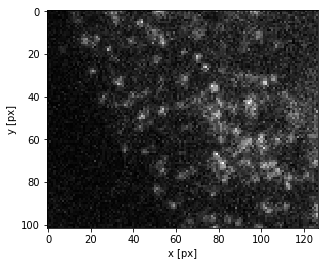

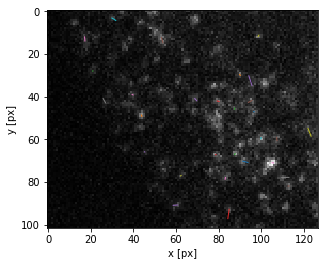

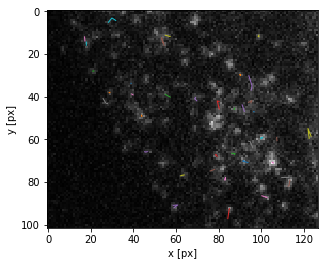

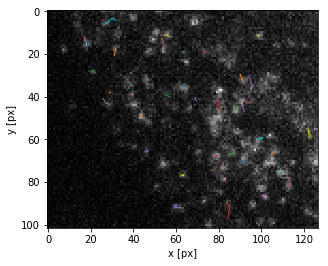

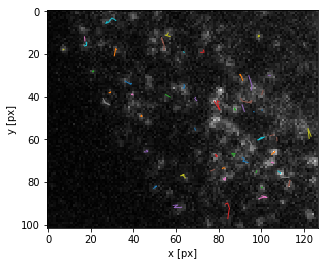

...

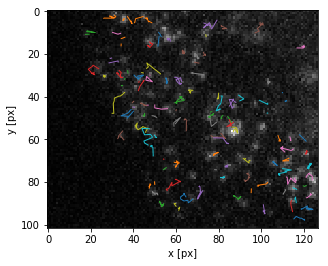

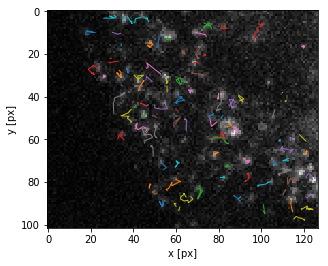

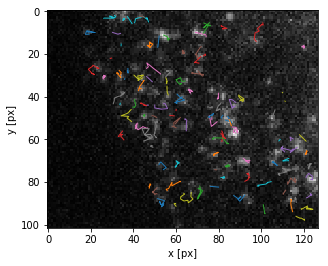

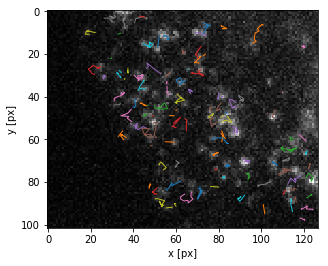

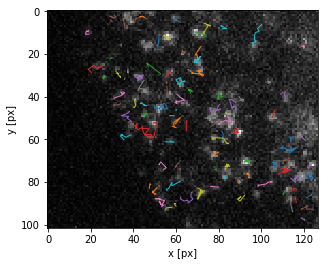

finished


In [41]:
# installed ffmpeg : https://github.com/adaptlearning/adapt_authoring/wiki/Installing-FFmpeg
# installed ffmpeg-python : pip install ffmpeg-python
# conda install -c conda-forge ffmpeg      <---- this is what ended up working 

#fig, ax = plt.subplots(1,1)
#tp.ptraj(t1, superimpose=frames[0], label=False, ax=ax)
#ax.grid(False)
#plt.show()

trail = 10 # include tracks from last 5 frames 

print('starting')

#fig = plt.figure()

# movie of first 50 frames 
for t in range(0,200): 
    fig, ax = plt.subplots(1,1)
    ax.grid(False)
    tnow = t1.query('frame > (%d)'%(t-trail)).query('frame <= %d' %(t))
    img = tp.ptraj(tnow, superimpose=frames[t], label=False, animated=True)
    fig.savefig('./vid_gen_temp/f%s.png' %("{0:0=5d}".format(t)), bbox_inches='tight')

    # navigate to vid_gen_temp and open terminal, run command: 
# ffmpeg -f image2 -r 10 -i f%05d.png -vcodec mpeg4 -y -vb 40M traj_movie.mp4
    
print('finished')
    

In [43]:
type(plt.imshow(data[0].img[0], animated=True))

TypeError: 'tif_img' object does not support indexing

# using thunderSTORM for localization 

In [44]:
# load dataframe 
pos_dat = spt.import_thunderSTORM_results('180920_Cs1C2_CAD_JFHaloLifeactRac_14ms_2Kfr_02-CROPPED_thunderSTORM-localization.csv')

pos_dat.head()

,id,frame,x [nm],y [nm],sigma [nm],intensity [photon],offset [photon],bkgstd [photon],uncertainty_xy [nm],x,y
0,1,1,2018.87248,1574.32014,194.31873,29460.46786,366.55893,308.09128,18.38085,18.188040,14.183064
1,2,1,2371.47695,3169.58491,109.48203,11617.72319,325.86116,212.30794,10.82891,21.364657,28.554819
2,3,1,2512.04992,1552.10696,204.46521,25663.95899,357.70372,382.63577,28.89197,22.631080,13.982946
3,4,1,2923.18432,4591.43552,119.32862,7591.49203,466.69000,270.33498,24.62246,26.334994,41.364284
4,5,1,3209.22958,2018.62465,62.89136,6616.28762,512.60080,262.16734,8.98768,28.911978,18.185808


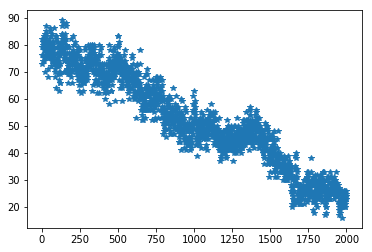

131    89
158    88
136    88
135    87
27     87
Name: frame, dtype: int64

In [45]:
frame_feature_count = pos_dat["frame"].value_counts()
plt.figure()
plt.plot(frame_feature_count, '*')
plt.show()

frame_feature_count.head()

There may have been an increase in the excitation intensity which changed the number of particles activated. 

May need to do a local fit. or this may be totally inaccurate. 

In [46]:
reg_df = pd.DataFrame({'particle_count':frame_feature_count, 'frame':frame_feature_count.index.values})
reg_df.head()
#df = pd.DataFrame({"A": [10,20,30,40,50], "B": [20, 30, 10, 40, 50], "C": [32, 234, 23, 23, 42523]})
lifespan_regression = sm.ols(formula="particle_count ~ frame", data=reg_df).fit()
print(lifespan_regression.summary())
print(lifespan_regression.params)

                            OLS Regression Results                            
Dep. Variable:         particle_count   R-squared:                       0.918
Model:                            OLS   Adj. R-squared:                  0.918
Method:                 Least Squares   F-statistic:                 2.235e+04
Date:                Tue, 26 Mar 2019   Prob (F-statistic):               0.00
Time:                        14:07:57   Log-Likelihood:                -6064.2
No. Observations:                2000   AIC:                         1.213e+04
Df Residuals:                    1998   BIC:                         1.214e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     81.1328      0.225    361.165      0.0

$$ num\,particles\,inframe = -0.029*frame + 81.13 $$ 

where,   

$$ beta = \frac{-0.029 * particles\,(dying)}{frame} $$

so,  

$$ \frac{1}{beta} = \frac{frames}{particle} -> E(lifespan)\, = \, 34.39\,\frac{frames}{particle} $$ 

at 14ms per frame, 

$$ lifespan\, = \, \frac{481.46\, ms}{particle} $$



Another aspect of multifluorophore photobleaching data that complicates the identification of bleaching steps is the fact that the frequency of photobleaching events for an ensemble of fluorophores changes over time. Photobleaching is typically modeled as a first-order process with rate λ and characteristic bleach time T, where λ = 1/T. Thus the time it takes for a single fluorophore in a set to bleach will follow an exponential distribution with mean of T. If there are n fluorophores in a diffraction-limited spot, then the mean time before the first bleaching event will be much faster because any of the fluorophores can bleach. Assuming that photobleaching events are independent of one another, the time before the first bleaching event will also follow an exponential distribution, with a rate equal to nλ, and the mean time before the first photobleaching event will be T/n. Thus, at the beginning of an experiment, bleaching events will be more frequent and will be associated with larger signal variance, making it difficult to identify individual events. [ref](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4230622/)  



Probability density function for Exponential distribution 

$$ p(t)\,=\,\gamma*e^{-\gamma*t} $$

where, for us: 

$$ \gamma = \frac{1}{T} \,\, and, \\\\ T\,=\,481\,ms \,\, therefore, \\\\\gamma\,=\,2.07e-3 $$

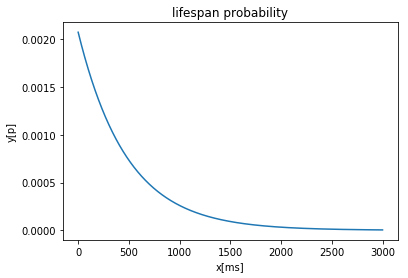

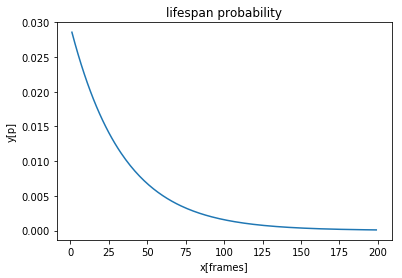

In [47]:
T = 481 # ms
l = 1/T
x=np.arange(1,3000,1)
y=l*np.exp(-l*x)
life_df = pd.DataFrame({'x[ms]':x, 'y[p]':y})

plt.figure()
sbn.lineplot(x='x[ms]', y='y[p]', data=life_df).set_title('lifespan probability')
plt.show()

T = 34 # frames
l = 1/T
x=np.arange(1,200,1)
y=l*np.exp(-l*x)
life_df = pd.DataFrame({'x[frames]':x, 'y[p]':y})

plt.figure()
sbn.lineplot(x='x[frames]', y='y[p]', data=life_df).set_title('lifespan probability')
plt.show()

In [49]:
# link frames 
# assume limited merging/splitting/missing
t = tp.link_df(pos_dat, 5, memory=1)

Frame 2000: 26 trajectories present.


In [50]:
t.head(10)


,id,frame,x [nm],y [nm],sigma [nm],intensity [photon],offset [photon],bkgstd [photon],uncertainty_xy [nm],x,y,particle
0,1,1,2018.87248,1574.32014,194.31873,29460.46786,366.55893,308.09128,18.38085,18.188040,14.183064,0
54,55,1,10610.70505,5101.33812,413.97520,191234.24777,0.00000,459.60950,18.75490,95.591937,45.958001,1
53,54,1,10628.74706,3529.80305,256.98594,38421.12798,482.94362,366.16038,28.91956,95.754478,31.800027,2
52,53,1,10390.24644,7912.19594,152.33271,15592.88076,920.20149,371.77672,26.14485,93.605824,71.281045,3
51,52,1,10374.58171,6911.90472,291.33327,92272.30040,389.35301,460.72569,19.41277,93.464700,62.269412,4
50,51,1,10644.40186,4875.95907,366.07882,184219.36271,0.00001,627.20345,20.79520,95.895512,43.927559,5
49,50,1,10016.61110,3538.46357,478.18714,152246.97206,0.00000,427.81531,29.19463,90.239740,31.878050,6
48,49,1,9839.77189,6293.40869,136.03770,20975.72847,864.72322,384.37446,16.21509,88.646594,56.697376,7
47,48,1,9863.65554,7363.41331,183.54359,13196.76445,919.57578,431.63741,51.32585,88.861762,66.337057,8
46,47,1,9680.70681,5076.30163,275.42822,58153.20569,284.23881,376.75175,22.54757,87.213575,45.732447,9


Before: 19316
After: 19308


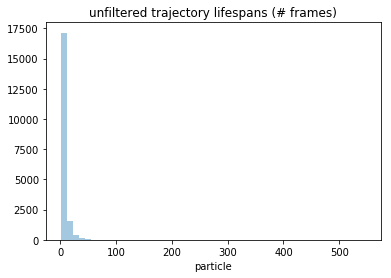

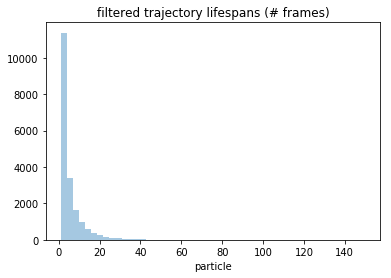

In [51]:
# filter short duration tracks 
#t1 = tp.filter_stubs(t, 5) # value is # frames needed to survive - we estimated 23 frame lifespan above

estimated_mean = 34 # frame lifetime
est_spread=20
low_thresh=0#estimated_mean - est_spread 
up_thresh=150#estimated_mean + est_spread

grouped = t.reset_index(drop=True).groupby('particle')
filtered = grouped.filter(lambda x: (x.frame.count() >= low_thresh) and (x.frame.count() <= up_thresh))
t_filt = filtered.set_index('frame', drop=False)

# should filter tracks with frames > 33 too # what distribution patterns does photobleaching follow?
# can also try to filter tracks that DONT move at all. 
# Compare the number of particles in the unfiltered and filtered data.
print('Before:', t['particle'].nunique())
print('After:', t_filt['particle'].nunique())

fig = plt.figure()
a=t['particle'].value_counts()
sbn.distplot(a, kde=False).set_title('unfiltered trajectory lifespans (# frames)')
plt.show()

fig =plt.figure()
b = t_filt['particle'].value_counts()
sbn.distplot(b, kde=False).set_title('filtered trajectory lifespans (# frames)')
plt.show()

TODO - fit exponential decay regression to the filtered trajectory lifespans 0-250 and calculate T,lambda from that fit. 

Can we characterize trajectory linking error rates from this? eg the differences between expected lifetime distribution and trajectory results?   
